# Set-Up

In [1]:
# Install Requirements

!pip install -r requirements.txt

In [ ]:
# Import packages

import os
import numpy as np
import rasterio
from rasterio.windows import from_bounds
from rasterio.windows import Window
from glob import glob
import matplotlib.pyplot as plt
from rasterio.warp import transform_bounds
from rasterio.merge import merge
import os, json
import numpy as np
import rasterio
from rasterio.windows import Window
import os, json
from glob import glob
import numpy as np
import rasterio
from rasterio.windows import Window, from_bounds
from rasterio.merge import merge
from rasterio.warp import transform_bounds
import matplotlib.pyplot as plt
import os, json
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.merge import merge
from rasterio.windows import Window, from_bounds
from rasterio.warp import transform_bounds
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import rasterio
import json
from glob import glob
import numpy as np


# Patching

In [3]:
# Unzip files in directory

def unzip_files_in_directory(directory):
    """
    Unzips all .zip files in the specified directory.
    
    Args:
        directory (str): The path to the directory containing .zip files.
    """
    import zipfile
    
    for filename in glob(os.path.join(directory, '*.zip')):
        with zipfile.ZipFile(filename, 'r') as zip_ref:
            zip_ref.extractall(directory)
        print(f"Unzipped {filename}")

unzip_files_in_directory('/cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads')

Unzipped /cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads/S2A_MSIL2A_20240422T173911_N0510_R098_T17XNA_20240423T004122.SAFE.zip
Unzipped /cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads/S2A_MSIL2A_20240502T173911_N0510_R098_T18XVF_20240502T232553.SAFE.zip
Unzipped /cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads/S2B_MSIL2A_20240501T171859_N0510_R012_T18XVF_20240501T214925.SAFE.zip
Unzipped /cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads/S2B_MSIL2A_20240501T171859_N0510_R012_T17XPA_20240501T214925.SAFE.zip
Unzipped /cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads/S2A_MSIL2A_20240422T173911_N0510_R098_T17XPA_20240423T004122.SAFE.zip
Unzipped /cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads/S2A_MSIL

In [ ]:
# --------------------------
# CONFIGURATION
# --------------------------

patch_size = 256  # 1m
stride = 128      # overlapping
valid_threshold = 0.7
num_regions = 10

lidar_dir = "/cs/student/projects2/aisd/2024/tcannon/dissertation/data/tifs"
out_lidar_dir = "./lidar_patches"
out_s2_dir = "./s2_patches_multi"
os.makedirs(out_lidar_dir, exist_ok=True)
os.makedirs(out_s2_dir, exist_ok=True)

sentinel_granule_dirs = [
    "/cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads/S2A_MSIL2A_20240422T173911_N0510_R098_T17XNA_20240423T004122.SAFE/GRANULE",
    "/cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads/S2B_MSIL2A_20240424T172859_N0510_R055_T17XNA_20240424T195611.SAFE/GRANULE",
    "/cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads/S2A_MSIL2A_20240426T171901_N0510_R012_T17XNA_20240426T223050.SAFE/GRANULE",
    "/cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads/S2B_MSIL2A_20240427T173859_N0510_R098_T17XNA_20240427T200733.SAFE/GRANULE",
    "/cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads/S2A_MSIL2A_20240429T172901_N0510_R055_T17XNA_20240429T222851.SAFE/GRANULE",
    "/cs/student/projects2/aisd/2024/tcannon/dissertation/Dissertation/master_model/sentinel_downloads/S2B_MSIL2A_20240430T174909_N0510_R141_T17XNA_20240430T201515.SAFE/GRANULE",
]

sentinel_meta_jsons = [g.replace(".SAFE/GRANULE", "_metadata.json") for g in sentinel_granule_dirs]

Total valid patches: 4615
Balanced Patch Counts:
Region 0: 462 patches
Region 1: 462 patches
Region 2: 462 patches
Region 3: 462 patches
Region 4: 462 patches
Region 5: 461 patches
Region 6: 461 patches
Region 7: 461 patches
Region 8: 461 patches
Region 9: 461 patches


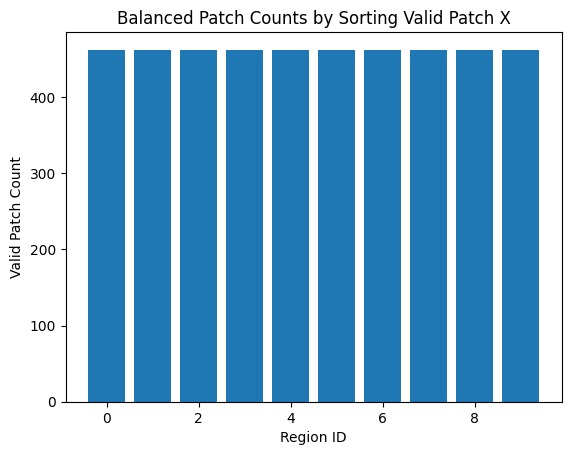

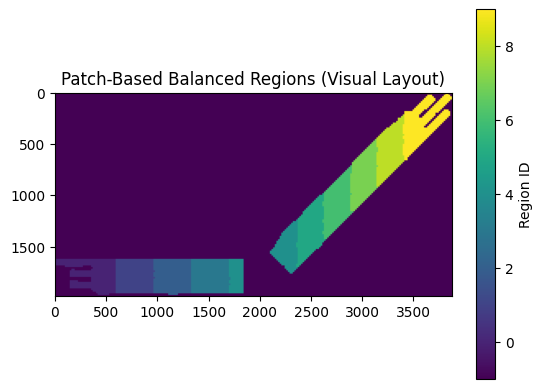

In [3]:
# --------------------------
# 2. MERGE LIDAR FILES
# --------------------------
def merge_lidar_files(lidar_files):
    src_files = [rasterio.open(fp) for fp in lidar_files]
    mosaic, mosaic_transform = merge(src_files)
    lidar_meta = src_files[0].meta.copy()
    lidar_meta.update({
        "height": mosaic.shape[1],
        "width": mosaic.shape[2],
        "transform": mosaic_transform
    })
    for src in src_files:
        src.close()
    return mosaic[0], mosaic_transform, lidar_meta

lidar_files = glob(os.path.join(lidar_dir, "*1m.tif"))
lidar_array, lidar_transform, lidar_meta = merge_lidar_files(lidar_files)
lidar_crs = lidar_meta["crs"]
s2_patch_size = patch_size // 10

# -----------------------------
# CONFIGURATION
# -----------------------------
patch_size = 256
stride = 128
valid_threshold = 0.7
num_regions = 10

# Example: lidar_array = np.load("lidar.npy")  # Replace with your real data
# Replace -9999 with NaN
lidar_array = np.where(lidar_array == -9999, np.nan, lidar_array)
H, W = lidar_array.shape
mask = ~np.isnan(lidar_array)

# STEP 1: Slide window and store all valid patch positions (x, y)
patches = []

for y in range(0, H - patch_size + 1, stride):
    for x in range(0, W - patch_size + 1, stride):
        patch_mask = mask[y:y + patch_size, x:x + patch_size]
        if patch_mask.mean() >= valid_threshold:
            patches.append((x, y))

patches = np.array(patches)
print(f"Total valid patches: {len(patches)}")

# Sort by x (patch start)
sorted_patches = patches[np.argsort(patches[:, 0])]

# Split into 10 equal-size groups
patch_bins = np.array_split(sorted_patches, num_regions)
region_patch_indices = [list(bin) for bin in patch_bins]

# Count patches
region_patch_counts = [len(r) for r in region_patch_indices]
print("Balanced Patch Counts:")
for i, count in enumerate(region_patch_counts):
    print(f"Region {i}: {count} patches")

# Plot
plt.bar(range(num_regions), region_patch_counts)
plt.xlabel("Region ID")
plt.ylabel("Valid Patch Count")
plt.title("Balanced Patch Counts by Sorting Valid Patch X")
plt.show()

# Generate region overlay map
overlay = np.full_like(lidar_array, -1, dtype=int)

for region_id, patch_list in enumerate(region_patch_indices):
    for x, y in patch_list:
        overlay[y:y+patch_size, x:x+patch_size] = region_id

# Downsample for speed
overlay_vis = overlay[::8, ::8]

plt.imshow(overlay_vis)
plt.title("Patch-Based Balanced Regions (Visual Layout)")
plt.colorbar(label="Region ID")
plt.show()


Processed 500 patches...
Processed 1000 patches...
Processed 1500 patches...
Processed 2000 patches...
Processed 2500 patches...
Processed 3000 patches...
Processed 3500 patches...
Processed 4000 patches...
Processed 4500 patches...
✅ Extracted 4615 LiDAR patches across 10 regions.


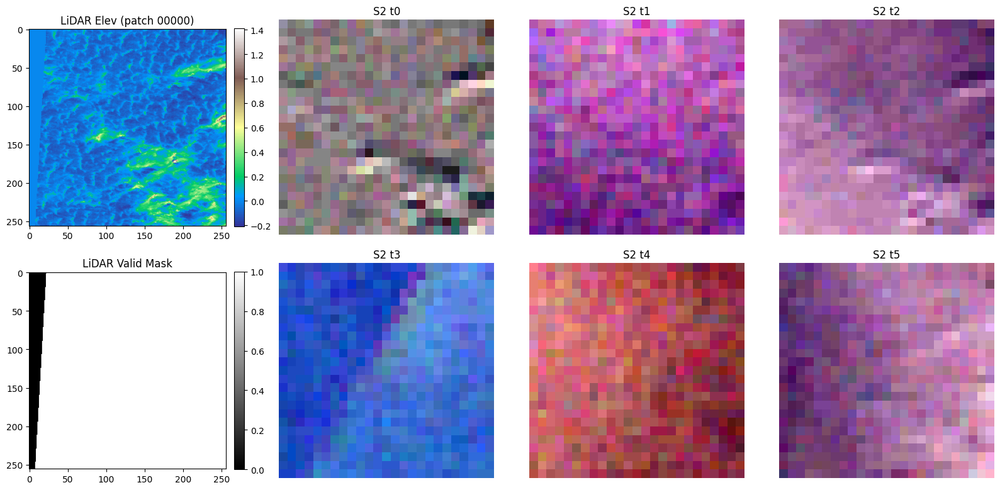

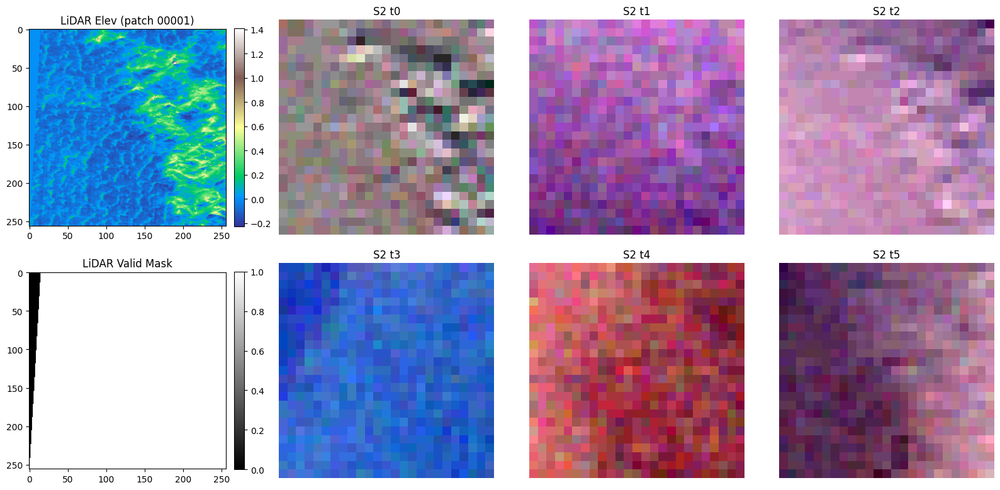

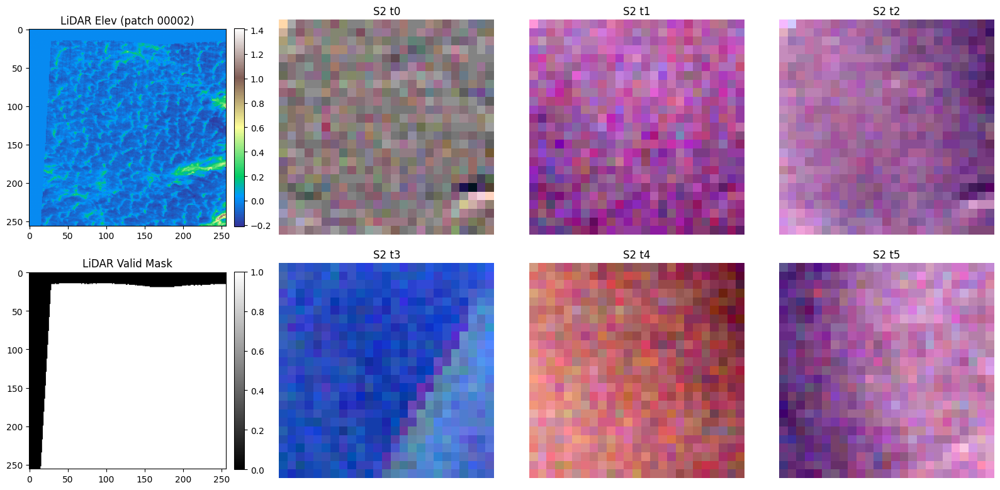

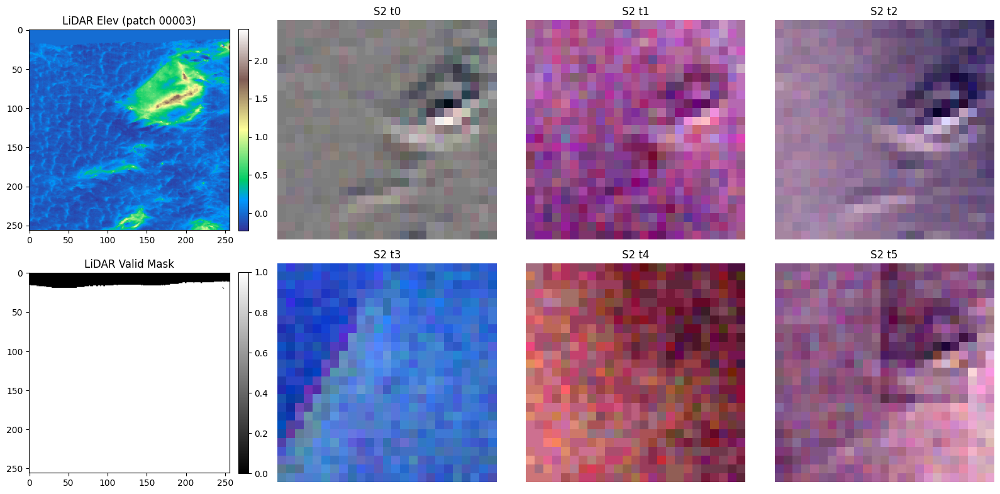

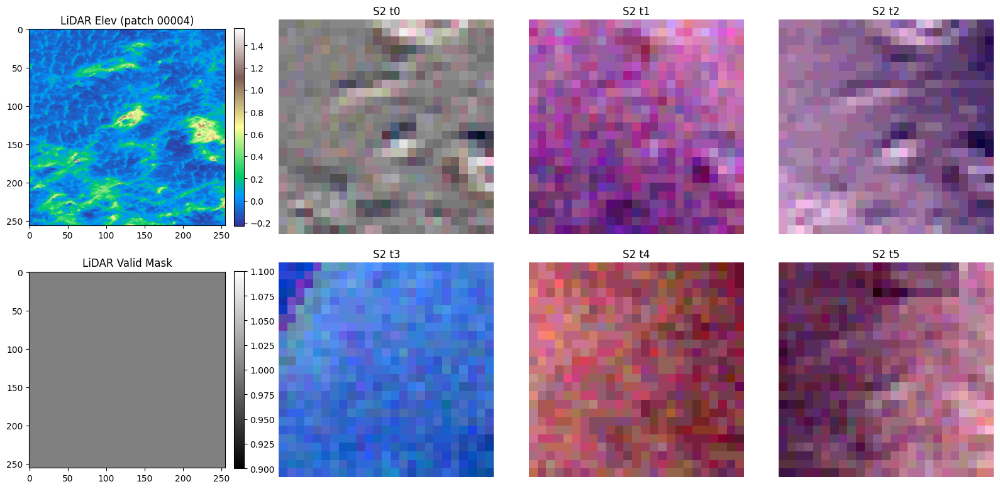

In [4]:
# --------------------------
# 1. STACK S2 BANDS
# --------------------------
def stack_sentinel_bands(safe_granule_path):
    band_files = {}
    for band in ["B02", "B03", "B04", "B08"]:
        pattern = os.path.join(safe_granule_path, "**", f"*_{band}_10m.jp2")
        matches = glob(pattern, recursive=True)
        if not matches:
            raise FileNotFoundError(f"Could not find band {band} in {safe_granule_path}.")
        band_files[band] = matches[0]

    band_stack = []
    meta = None
    for band in ["B04", "B03", "B02", "B08"]:
        with rasterio.open(band_files[band]) as src:
            band_stack.append(src.read(1))
            if meta is None:
                meta = src.meta.copy()
    stacked = np.stack(band_stack, axis=0)  # (4, H, W)
    return stacked, meta

def load_json_safe(path):
    if path is None or not os.path.exists(path):
        return None
    with open(path, "r") as f:
        return json.load(f)

sentinel_products = []
for i, gdir in enumerate(sentinel_granule_dirs):
    stack, meta = stack_sentinel_bands(gdir)
    sentinel_products.append({
        "stack": stack,
        "meta": meta,
        "transform": meta["transform"],
        "crs": meta["crs"],
        "attrs": load_json_safe(sentinel_meta_jsons[i])
    })

# --------------------------
# 4. EXTRACT PATCHES
# --------------------------
def extract_lidar_multi_s2_by_region(
    lidar_array, lidar_transform, lidar_crs,
    sentinel_products,
    patch_size, s2_patch_size,
    out_lidar_dir, out_s2_dir,
    region_patch_indices,
    start_idx=0):

    lidar_array = np.where(lidar_array == -9999, np.nan, lidar_array)
    count = 0

    for region_id, patch_list in enumerate(region_patch_indices):
        for x, y in patch_list:
            lid_win = Window(x, y, patch_size, patch_size)
            lid_bounds = rasterio.windows.bounds(lid_win, lidar_transform)
            lid_patch_raw = lidar_array[y:y+patch_size, x:x+patch_size]
            valid_mask = ~np.isnan(lid_patch_raw)
            if valid_mask.mean() < valid_threshold:
                continue

            lid_patch = np.nan_to_num(lid_patch_raw, nan=0.0)
            lid_mask = valid_mask.astype(np.uint8)
            lidar_patch = np.stack([lid_patch, lid_mask], axis=0)

            s2_patches, s2_transforms, ok = [], [], True
            for prod in sentinel_products:
                try:
                    s2_bounds = transform_bounds(lidar_crs, prod["crs"], *lid_bounds, densify_pts=21)
                    s2_window = from_bounds(*s2_bounds, prod["transform"])
                    s2_row = int(s2_window.row_off)
                    s2_col = int(s2_window.col_off)
                    s2_patch = prod["stack"][:, s2_row:s2_row + s2_patch_size, s2_col:s2_col + s2_patch_size]
                    if s2_patch.shape[1:] != (s2_patch_size, s2_patch_size):
                        ok = False
                        break
                    s2_patches.append(s2_patch)
                    s2_transforms.append(rasterio.windows.transform(s2_window, prod["transform"]))
                except Exception:
                    ok = False
                    break

            if not ok or len(s2_patches) != len(sentinel_products):
                continue

            patch_id = f"{start_idx + count:05d}"
            lid_out = os.path.join(out_lidar_dir, f"lidar_patch_{patch_id}.tif")
            lid_meta = {
                "driver": "GTiff",
                "height": patch_size,
                "width": patch_size,
                "count": 2,
                "dtype": lidar_patch.dtype,
                "crs": lidar_crs,
                "transform": rasterio.windows.transform(lid_win, lidar_transform)
            }
            with rasterio.open(lid_out, "w", **lid_meta) as dst:
                dst.write(lidar_patch)

            patch_dir = os.path.join(out_s2_dir, f"s2_patch_{patch_id}")
            os.makedirs(patch_dir, exist_ok=True)
            attrs_list = []

            for i, (prod, s2_patch, s2_tr) in enumerate(zip(sentinel_products, s2_patches, s2_transforms)):
                s2_meta = prod["meta"].copy()
                s2_meta.update({
                    "count": 4,
                    "height": s2_patch_size,
                    "width": s2_patch_size,
                    "transform": s2_tr
                })
                s2_path = os.path.join(patch_dir, f"t{i}.tif")
                with rasterio.open(s2_path, "w", **s2_meta) as dst:
                    dst.write(s2_patch)

                record = None
                if prod.get("attrs"):
                    a = prod["attrs"]
                    record = {
                        "product_id": a.get("product_id") or a.get("productId"),
                        "product_name": a.get("product_name") or a.get("productName"),
                        "acquisition_date": a.get("acquisition_date"),
                        "cloud_cover": a.get("cloud_cover"),
                        "sun_zenith_mean": a.get("sun_zenith_mean"),
                        "sun_azimuth_mean": a.get("sun_azimuth_mean"),
                        "view_zenith_mean": a.get("view_zenith_mean"),
                        "view_azimuth_mean": a.get("view_azimuth_mean"),
                    }
                attrs_list.append(record)

            with open(os.path.join(patch_dir, "attrs.json"), "w") as jf:
                json.dump(attrs_list, jf, indent=2)

            with open(os.path.join(patch_dir, "region.json"), "w") as jf:
                json.dump({"region_id": region_id}, jf)

            count += 1
            if count // 500 > 0 and count % 500 == 0:
                print(f"Processed {count} patches...")

    return count

# --------------------------
# RUN EXTRACTION
# --------------------------
total = extract_lidar_multi_s2_by_region(
    lidar_array=lidar_array,
    lidar_transform=lidar_transform,
    lidar_crs=lidar_crs,
    sentinel_products=sentinel_products,
    patch_size=patch_size,
    s2_patch_size=s2_patch_size,
    out_lidar_dir=out_lidar_dir,
    out_s2_dir=out_s2_dir,
    region_patch_indices=region_patch_indices,
    start_idx=0
)

print(f"\u2705 Extracted {total} LiDAR patches across {num_regions} regions.")

# --------------------------
# VISUALIZATION (LiDAR + 6x S2)
# --------------------------
def normalize_01(img):
    img = img.astype(np.float32)
    mn, mx = np.nanmin(img), np.nanmax(img)
    if mx <= mn:
        return np.zeros_like(img)
    return (img - mn) / (mx - mn)

def show_group(patch_id, out_lidar_dir, out_s2_dir):
    lid_path = os.path.join(out_lidar_dir, f"lidar_patch_{patch_id}.tif")
    s2_dir  = os.path.join(out_s2_dir, f"s2_patch_{patch_id}")

    with rasterio.open(lid_path) as src:
        lidar_elev = src.read(1)
        lidar_mask = src.read(2)

    s2_imgs = []
    for i in range(6):
        s2_path = os.path.join(s2_dir, f"t{i}.tif")
        with rasterio.open(s2_path) as src:
            rgb = src.read([1, 2, 3])
        rgb = np.moveaxis(rgb, 0, -1)
        s2_imgs.append(normalize_01(rgb))

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    ax = axes.ravel()

    im0 = ax[0].imshow(lidar_elev, cmap="terrain")
    ax[0].set_title(f"LiDAR Elev (patch {patch_id})")
    plt.colorbar(im0, ax=ax[0], fraction=0.046, pad=0.04)

    im1 = ax[4].imshow(lidar_mask, cmap="gray")
    ax[4].set_title("LiDAR Valid Mask")
    plt.colorbar(im1, ax=ax[4], fraction=0.046, pad=0.04)

    titles = [f"S2 t{i}" for i in range(6)]
    for i in range(3):
        ax[1 + i].imshow(s2_imgs[i])
        ax[1 + i].set_title(titles[i])
        ax[1 + i].axis("off")

    for i in range(3, 6):
        ax[5 + (i - 3)].imshow(s2_imgs[i])
        ax[5 + (i - 3)].set_title(titles[i])
        ax[5 + (i - 3)].axis("off")

    for a in ax:
        if not hasattr(a.images, "__len__") or len(a.images) == 0:
            a.axis("off")

    plt.tight_layout()
    plt.show()

# Example: visualize first few
sample_lidar = sorted(glob(os.path.join(out_lidar_dir, "lidar_patch_*.tif")))[:5]
for p in sample_lidar:
    pid = os.path.splitext(os.path.basename(p))[0].split("_")[-1]
    show_group(pid, out_lidar_dir, out_s2_dir)

/tmp/ipykernel_977630/3241782426.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", 10)


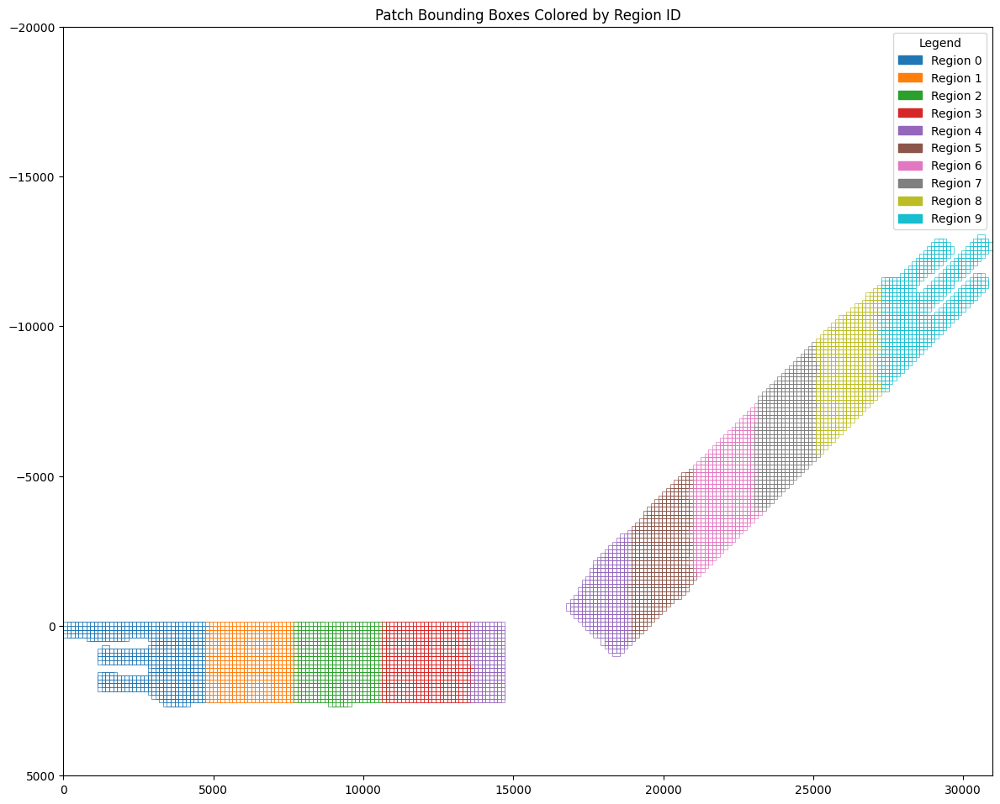

In [ ]:

# Load full lidar dimensions for background
with rasterio.open("./lidar_patches/lidar_patch_00000.tif") as src:
    lidar_crs = src.crs
    lidar_transform = src.transform

# Create figure
fig, ax = plt.subplots(figsize=(12, 12))

# Color map for 10 regions
colors = plt.cm.get_cmap("tab10", 10)

# Loop over patches
lidar_patch_paths = sorted(glob("./lidar_patches/lidar_patch_*.tif"))

for path in lidar_patch_paths:
    patch_id = os.path.basename(path).split("_")[-1].split(".")[0]
    region_path = os.path.join("./s2_patches_multi", f"s2_patch_{patch_id}", "region.json")
    
    # Load region ID
    with open(region_path, "r") as f:
        region_id = json.load(f)["region_id"]

    # Load bounding box
    with rasterio.open(path) as src:
        bounds = src.bounds
        # Convert to pixel coords (col, row) using lidar_transform
        x0 = int((bounds.left - lidar_transform.c) / lidar_transform.a)
        y0 = int((bounds.top - lidar_transform.f) / lidar_transform.e)
        x1 = x0 + patch_size
        y1 = y0 + patch_size

    # Draw rectangle
    rect = patches.Rectangle((x0, y0), patch_size, patch_size,
                             linewidth=0.5,
                             edgecolor=colors(region_id),
                             facecolor='none')
    ax.add_patch(rect)

# Display
ax.set_title("Patch Bounding Boxes Colored by Region ID")
ax.set_aspect('equal')
ax.legend(handles=[patches.Patch(color=colors(i), label=f"Region {i}") for i in range(10)],
          title="Legend")
ax.set_xlim(0, lidar_array.shape[1])
ax.set_ylim(5000, -20000)
plt.tight_layout()
plt.show()


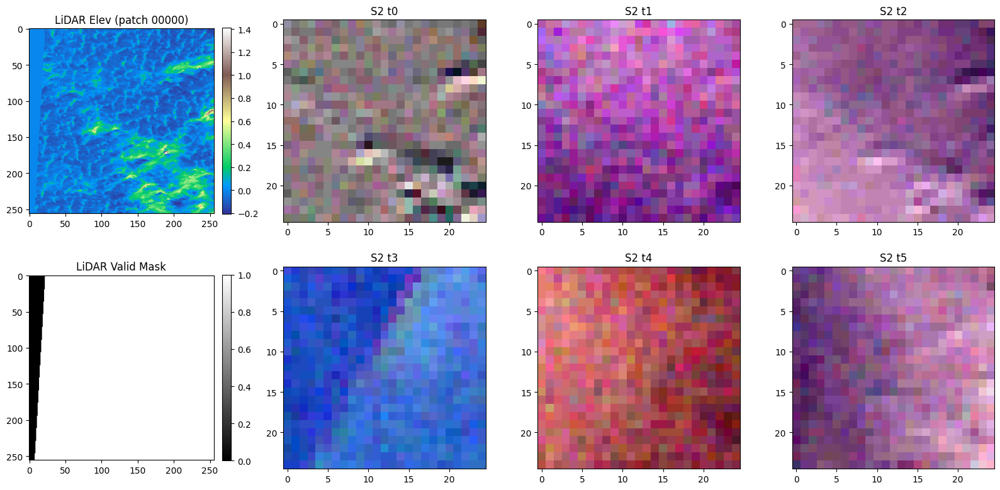

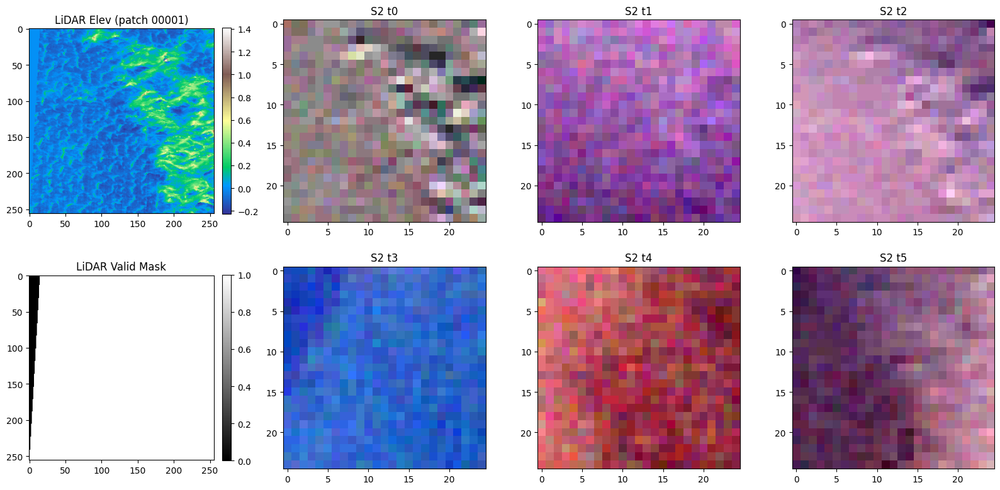

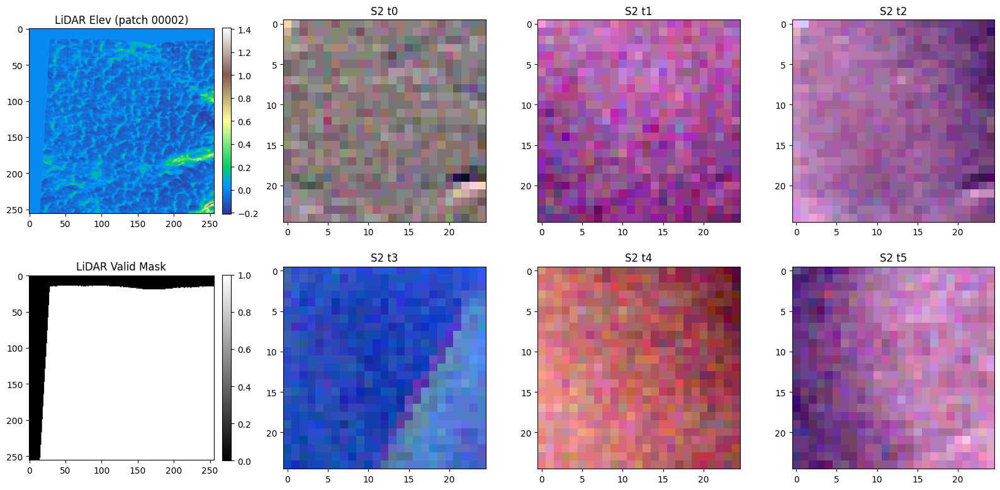

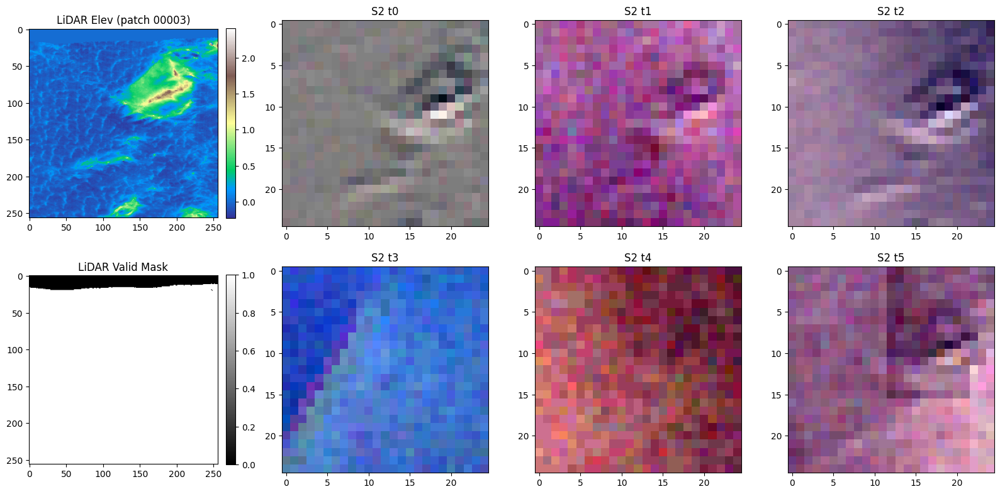

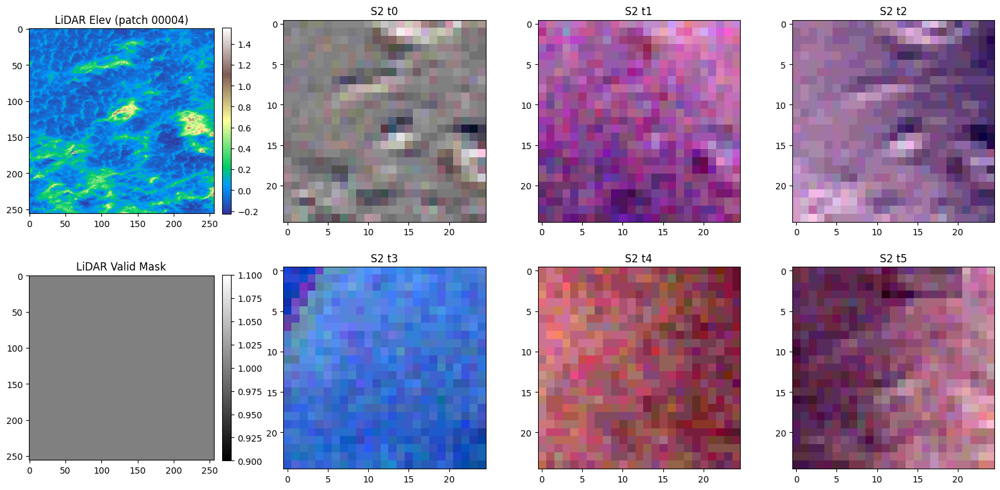

...

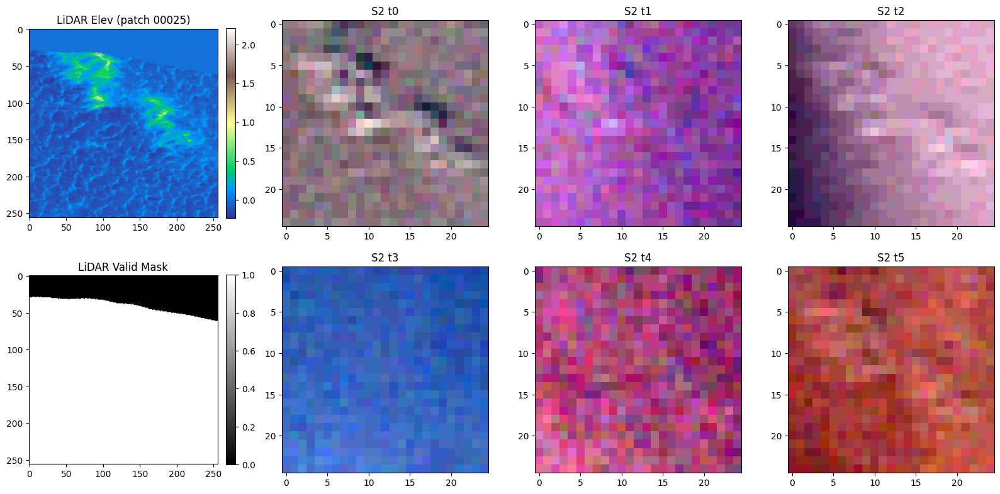

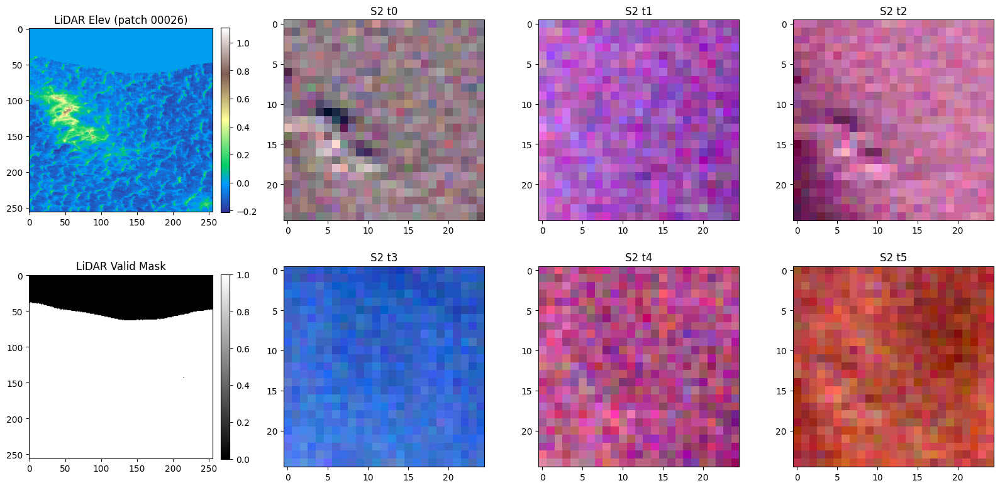

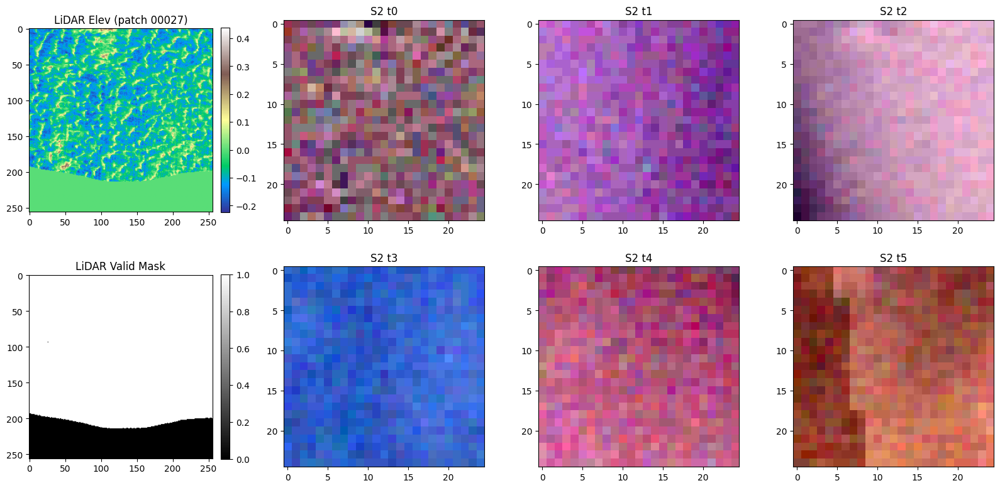

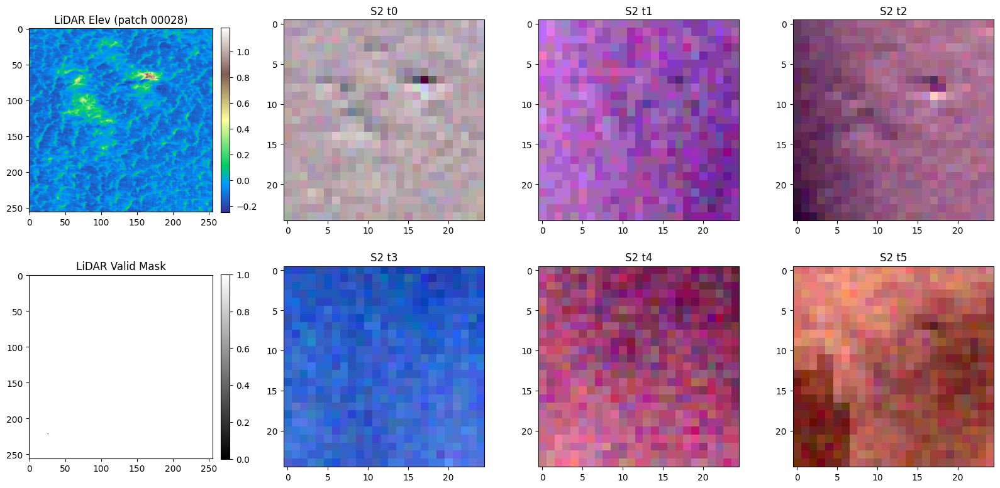

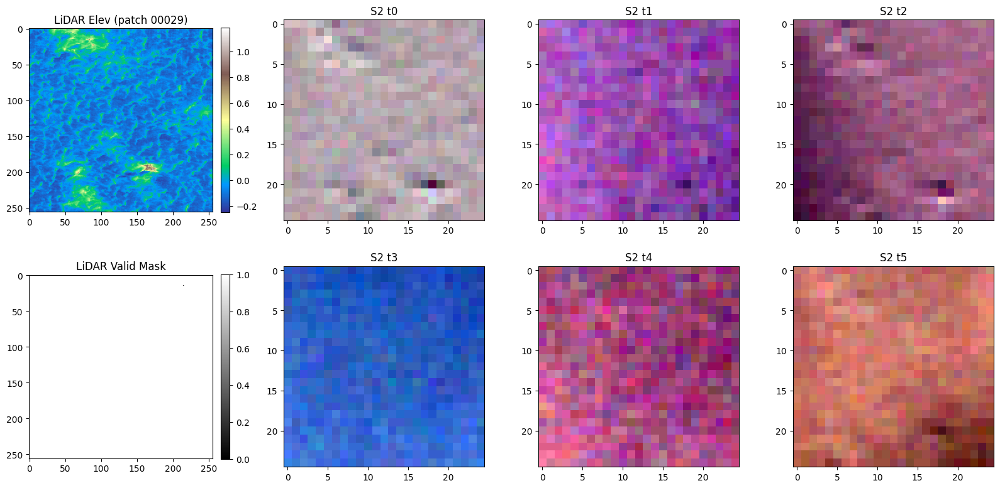

In [8]:
# --------------------------
# VISUALIZATION (LiDAR + 6x S2)
# --------------------------
def normalize_01(img):
    img = img.astype(np.float32)
    mn, mx = np.nanmin(img), np.nanmax(img)
    if mx <= mn:
        return np.zeros_like(img)
    return (img - mn) / (mx - mn)

def show_group(patch_id, out_lidar_dir, out_s2_dir):
    lid_path = os.path.join(out_lidar_dir, f"lidar_patch_{patch_id}.tif")
    s2_dir  = os.path.join(out_s2_dir, f"s2_patch_{patch_id}")

    with rasterio.open(lid_path) as src:
        lidar_elev = src.read(1)
        lidar_mask = src.read(2)

    s2_imgs = []
    for i in range(6):
        s2_path = os.path.join(s2_dir, f"t{i}.tif")
        with rasterio.open(s2_path) as src:
            rgb = src.read([1, 2, 3])
        rgb = np.moveaxis(rgb, 0, -1)
        s2_imgs.append(normalize_01(rgb))

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    ax = axes.ravel()

    im0 = ax[0].imshow(lidar_elev, cmap="terrain")
    ax[0].set_title(f"LiDAR Elev (patch {patch_id})")
    plt.colorbar(im0, ax=ax[0], fraction=0.046, pad=0.04)

    im1 = ax[4].imshow(lidar_mask, cmap="gray")
    ax[4].set_title("LiDAR Valid Mask")
    plt.colorbar(im1, ax=ax[4], fraction=0.046, pad=0.04)

    titles = [f"S2 t{i}" for i in range(6)]
    for i in range(3):
        ax[1 + i].imshow(s2_imgs[i])
        ax[1 + i].set_title(titles[i])
        ax[1 + i]

    for i in range(3, 6):
        ax[5 + (i - 3)].imshow(s2_imgs[i])
        ax[5 + (i - 3)].set_title(titles[i])
        ax[5 + (i - 3)]

    for a in ax:
        if not hasattr(a.images, "__len__") or len(a.images) == 0:
            a.axis("off")

    plt.tight_layout()
    plt.show()

# Example: visualize first few
sample_lidar = sorted(glob(os.path.join(out_lidar_dir, "lidar_patch_*.tif")))[:30]
for p in sample_lidar:
    pid = os.path.splitext(os.path.basename(p))[0].split("_")[-1]
    show_group(pid, out_lidar_dir, out_s2_dir)

# Sample Visualization

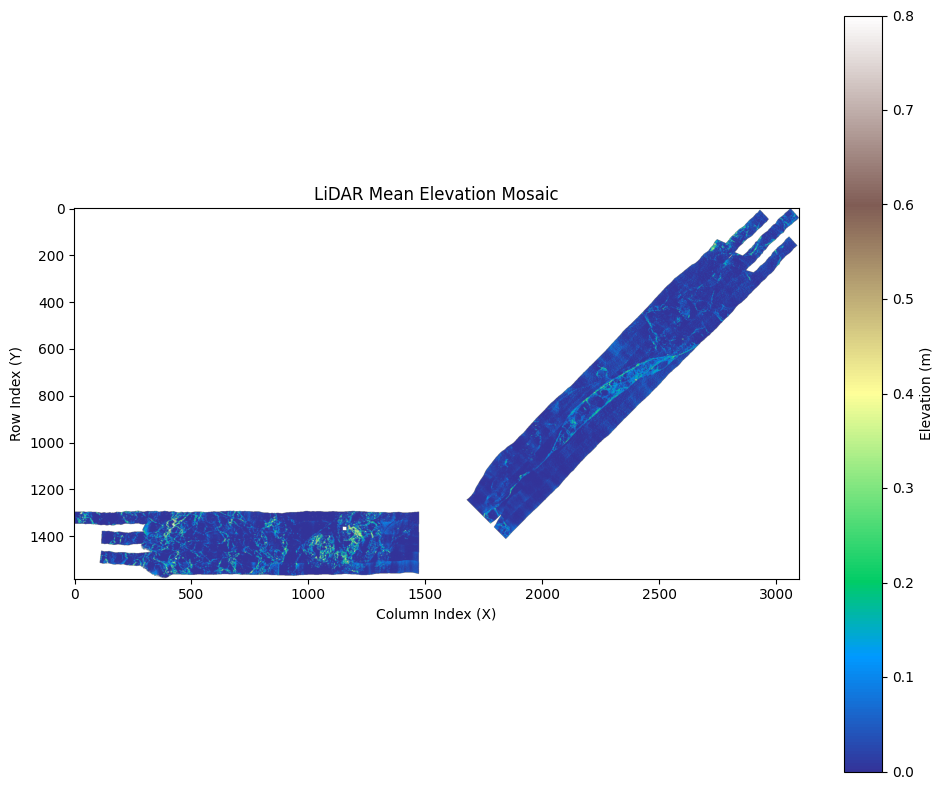

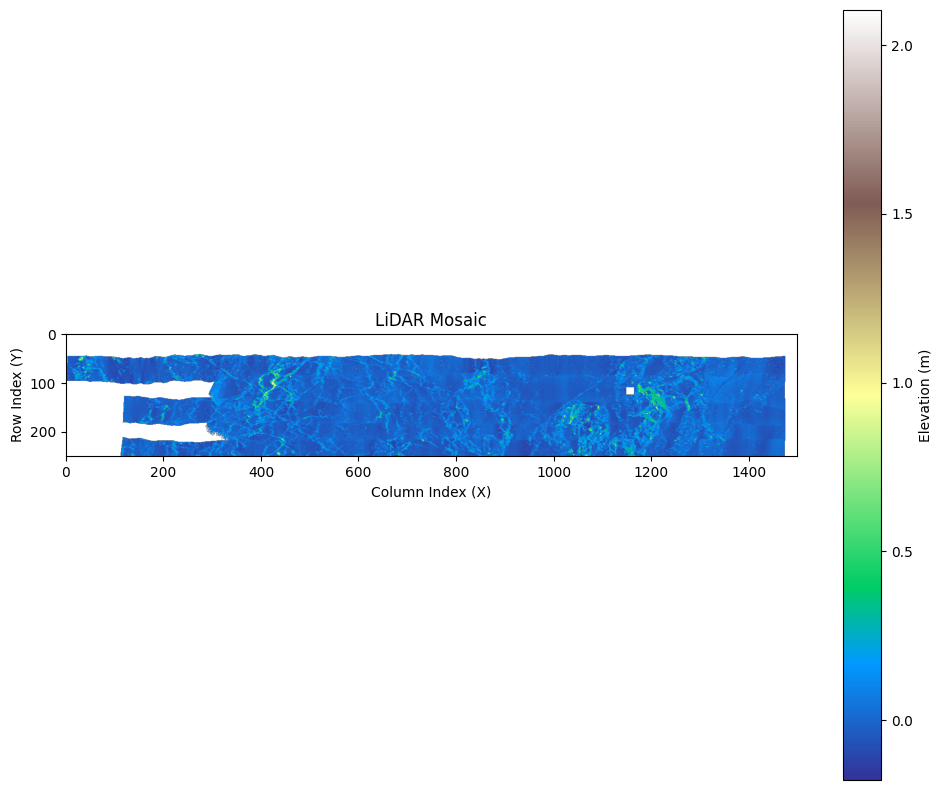

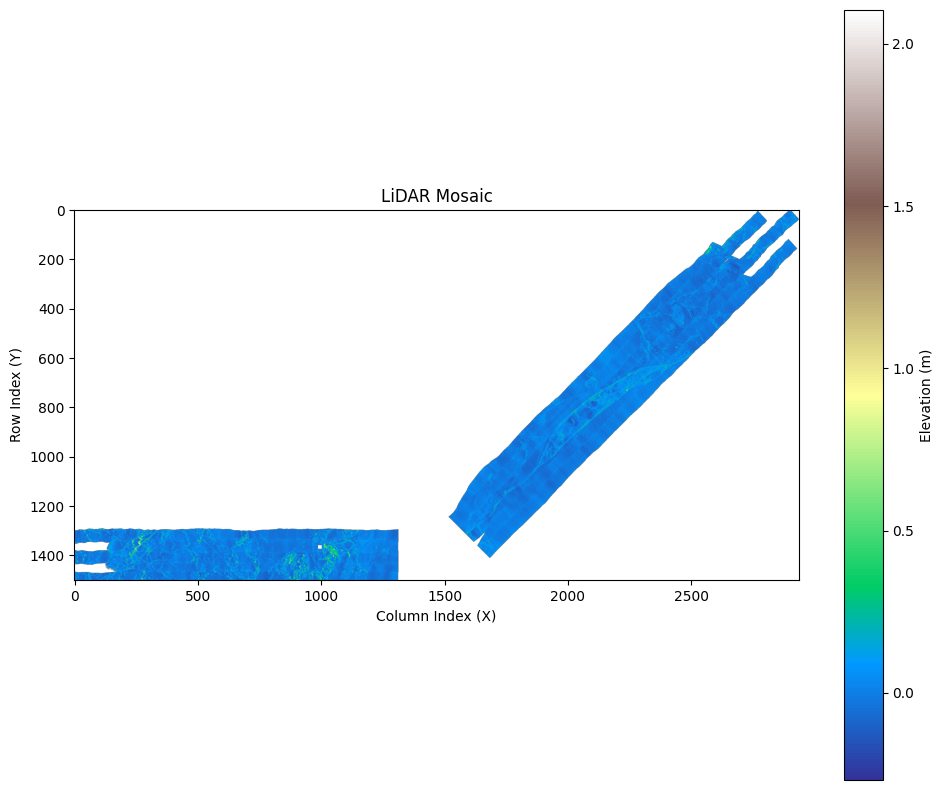

In [ ]:
# Split LiDAR regions

def plot_lidar_mosaic(lidar_array, title="LiDAR Mosaic", vmin=None, vmax=None):
    """
    Plot the LiDAR mean elevation mosaic with axis labels and a colorbar.

    Parameters:
    - lidar_array: np.ndarray of shape (H, W) or (2, H, W) if mean/std
    - title: plot title
    - vmin, vmax: value range for color normalization (optional)
    """
    if lidar_array.ndim == 3 and lidar_array.shape[0] == 2:
        lidar_array = lidar_array[0]  # show mean by default

    lidar_array = np.where(np.isnan(lidar_array), np.nan, lidar_array)

    plt.figure(figsize=(10, 8))
    im = plt.imshow(lidar_array, cmap="terrain", vmin=vmin, vmax=vmax)
    plt.colorbar(im, label="Elevation (m)")
    plt.title(title)
    plt.xlabel("Column Index (X)")
    plt.ylabel("Row Index (Y)")
    plt.grid(False)
    plt.tight_layout()
    plt.show()

# Plot the LiDAR mosaic
plot_lidar_mosaic(lidar_array, title="LiDAR Mean Elevation Mosaic", vmin=0, vmax=0.8)
plot_lidar_mosaic(lidar_array[:, 1250:1500, 0:1500])
plot_lidar_mosaic(lidar_array[:, 0:1500, 160:3200])

Suggested rotation angle: 44.73 degrees


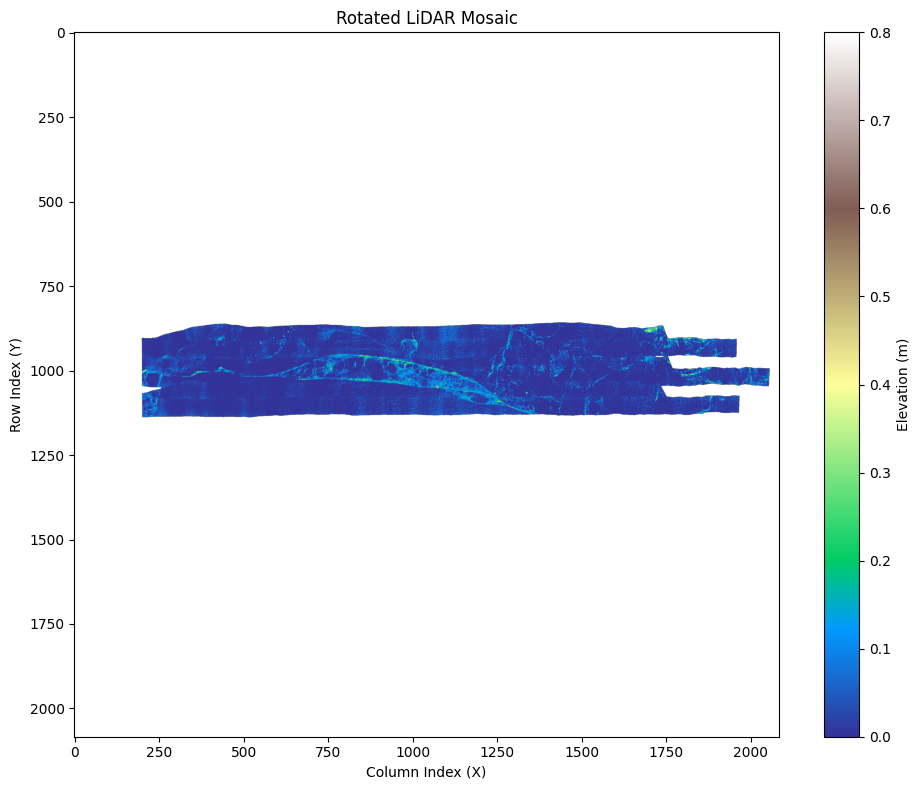

In [ ]:
# Rotate LiDAR region using principal components

# Extract the second swath
region = lidar_array[:, 0:1500, 1650:3200]
mask = ~np.isnan(region[0])  # use mean channel

# Get Y (rows) and X (cols) of valid pixels in this region
y_coords, x_coords = np.where(mask)

# Convert to real coordinates
coords = np.stack([x_coords, y_coords], axis=1)  # shape (N, 2)
pca = PCA(n_components=2)
pca.fit(coords)

# First principal component vector
direction_vector = pca.components_[0]  

angle_rad = np.arctan2(direction_vector[1], direction_vector[0])  # dy, dx
angle_deg = np.degrees(angle_rad)

print(f"Suggested rotation angle: {-angle_deg:.2f} degrees")

rotated_lidar = rotate(lidar_array[:, 0:1500, 1650:3200], angle=angle_deg, axes=(1, 2), reshape=True, order=1, mode='constant', cval=np.nan)
plot_lidar_mosaic(rotated_lidar, title="Rotated LiDAR Mosaic", vmin=0, vmax=0.8)
